In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings 
warnings.filterwarnings("ignore")
import random
import datetime
import scipy.stats as stats
from pandas import set_option
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

In [2]:
from sklearn.cluster import KMeans
from sklearn import metrics
from imblearn.over_sampling import SMOTE, RandomOverSampler, BorderlineSMOTE
from collections import Counter
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF
from sklearn.feature_selection import VarianceThreshold, SelectFromModel
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_curve, roc_auc_score, fbeta_score, make_scorer, recall_score  
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_validate, cross_val_score, KFold, StratifiedKFold, RepeatedKFold, LeaveOneOut
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier,RadiusNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier 
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import PCA

In [3]:
# 1A

In [4]:
path = 'signal-data.csv'
data = pd.read_csv(path)
data

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


In [5]:
# 1

In [6]:
data.describe()

,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


There is large variation in the mean values between features.

The total number of entries vary across features indicating the presence of null/NaN values.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


The original data is kept aside as data for final comparison of performnace of models with modified models.

In [8]:
data1 = data.drop('Time',axis=1)

In [9]:
data1['Pass/Fail'].unique()


array([-1,  1], dtype=int64)

In [10]:
data1['Pass/Fail'] = data1['Pass/Fail'].replace(to_replace=1,value=0)
data1['Pass/Fail'] = data1['Pass/Fail'].replace(to_replace=-1,value=1)

Changing datatype of target column as category

In [11]:
data1['Pass/Fail'] = data1['Pass/Fail'].astype('category')

In [12]:
# 2 A

In [13]:
data1.isnull().any().any()

True

Creating a for loop to remove all the features with 20%+ Null values

In [14]:
def remove_null(df, thres):
    columns = df.columns
    cols_remove = []
    for i in columns:
        if (df[i].isna().sum() / df.shape[0] >= thres):
            cols_remove.append(i)
    print('Number of features removed with more than 20% of null values \t:',
          len(cols_remove))
    df = df.drop(labels=cols_remove, axis=1)
    return (df)

Removing features having more than 20% null values

In [15]:
data2 = remove_null(data1,0.2)

Number of features removed with more than 20% of null values 	: 32


-A function is created for imputing NaN entries with mean of the corresponding feature and we use this function on splitted data instead of whole data. 

-If we use this function on data before splitting it might lead to data leakage as mean is calculated based on all datapoints which results in exposing test data hence we use this function after splitting data to avoid data leakage.

In [16]:
def imputer(df):   
    impute = SimpleImputer()
    df_imputed = pd.DataFrame(impute.fit_transform(df),columns=df.columns)
    return(df_imputed)

In [17]:
# Q2B

-The following function remove features with same value. Columns with same value for rows are identified by calculating the standard deviation.

-Columns with 0 standard deviation are removed.

In [18]:
def remove_duplicates(df):
    df_std = df.std()
    duplicate_features = df_std[df_std == 0].index
    print('Number of features removed with same row values t:',
          len(duplicate_features))
    df = df.drop(labels=duplicate_features, axis=1)
    return (df)

In [19]:
data3 = remove_duplicates(data2)

Number of features removed with same row values t: 116


In [20]:
# 2 C

Feature engineering steps to extract useful features:-

-Since the 'Time' column data is not useful in the context of the problem, it is dropped or removed in previous steps.

-Features having more than 20% null values are also removed.

-Features with same value in rows are identified and removed.

-Columns with 0 standard deviation are removed.

-Some other features are also removed based on their correlation using correlation function and Variance inflation 

 Factor(VIF).
 
-Along all these XGboost classifier is also used to identify and extract important features. 

Now, splitting the data before further processing

Data is split at this stage itself to prevent data leakage between training and test sets.

In [21]:
# 4 A (seggregation)

In [22]:
X = data3.drop(labels='Pass/Fail',axis=1)
y = data3['Pass/Fail']

Adding a prefix 'f' to the column names for easy identification.

In [23]:
X = X.add_prefix('f')

In [24]:
# 4 C (train_test_split)

Using a train-test split of 80%-20%.

The split is stratified to maintain the same dependent class distribution for train and test data.

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X,y,stratify=y,test_size=0.20,random_state=1)

In [26]:
print(X_train.shape)
print(X_test.shape)

(1253, 442)
(314, 442)


The NaN entries in the train and test sets are imputed by mean of the corresponding feature. This is done as a part of 2A

In [27]:
X_train1 = imputer(X_train)
X_test1 = imputer(X_test)

Outliers Treatment

In [28]:
def outliers(df):
    features = df.columns
    for j in features:
        Q1 = df[j].quantile(q=0.25)
        Q2 = df[j].median()
        Q3 = df[j].quantile(q=0.75)
        IQR = Q3 - Q1
        upper_boundary = Q3 + 1.5*IQR
        lower_boundary = Q1 - 1.5*IQR
        for i in range(0,df.shape[0]):
            if(df[j][i] > upper_boundary or df[j][i]<lower_boundary):
                df[j][i] = df[j].median() 
    return(df)

In [29]:
X_train2 = outliers(X_train1.reset_index(drop=True))
X_test2 = outliers(X_test1.reset_index(drop=True))

Outliers that exists beyond boundary are replaced with median.

In [30]:
# 2 D

Presence of Multi-collinearity can be ascertained by:

i) Checking for correlated independent features using correlation matrix. The threshold is selected as 0.80. 


ii)Checking for Variance Inflation Factor (VIF) of each independent feature. Features with VIF>10 are removed.

In [31]:
# i) Creating a function to identify correlation among the features and using this function to remove features having correlation less than 80%

In [32]:
def remove_corr(df, threshold):

    corr = pd.DataFrame(abs(df.corr()))

    Featurei = []
    Featurej = []
    Corr = []

    for i in corr.index:
        for j in corr.columns:
            if (corr.loc[i, j] > threshold and i != j):
                if(i not in Featurei):
                    Featurei.append(i)
                if(j not in Featurej):
                    Featurej.append(j)
                    Corr.append(corr.loc[i, j])
    
    d = pd.DataFrame([Featurei, Featurej, Corr]).transpose()
    display(d)
    
    to_drop = set(d[0])
    
    print('Number of features removed = ', len(to_drop))
    
    return (df.drop(to_drop, axis=1))

In [33]:
# Removing features that have correlation less than 80% by using the above function

In [34]:
X_train3 = remove_corr(X_train2, 0.80)

,0,1,2
0,f11,f147,0.905348
1,f12,f282,0.906995
2,f17,f420,0.909175
3,f18,f18,0.979013
4,f21,f153,0.877337
...,...,...,...
306,f583,f584,0.81529
307,f584,f585,0.995825
308,f585,f583,0.81529
309,f587,f588,0.832242


Number of features removed =  311


In [35]:
X_test3 = X_test2[X_train3.columns]

ii)Checking multicollinearity with Variance Inflation Factor (VIF)

In [36]:
def remove_high_VIF(df, limit):
    vif = pd.DataFrame()
    high_vif = []
    vif['features'] = df.columns
    vif['VIF'] = [VIF(df.values,i) for i in range(len(df.columns))]

    high_vif= vif[vif['VIF']>limit].features
    print('Number of features with VIF > ',limit,'= ',len(high_vif))
    return(df.drop(high_vif,axis=1))

In [37]:
X_train4 = remove_high_VIF(X_train3,10)
X_test4 = X_test3[X_train4.columns]

Number of features with VIF >  10 =  82


In [38]:
# 2 E

Modifications made on data (or) steps in cleaning data so far :-

-Dropping a column(Time) that is not useful in the context of problem.

-Changing the datatype of target column as 'category'.

-Removing features with more than 20% null values.

-Splitting data(To prevent data leakage).

-Imputing remaining null values with mean using imputer.

-Outliers Treatment.

-Removing columns with rows having same value.

-Identifying columns with '0' standard deviation and removing them.

-Cleaning data based on multicollinearity
                 i) Correlation
                 ii) Variation Inflation Factor(VIF)
                 
-Removing features based on variance(threshold).

-As we are dealing with a number of features(even after preprocessing), where both important and less useful features are 

 present we have done XGBoost to get important features by doing feature importance to train models.

Above steps were done to prepare data for training models on various algorithms.


In [39]:
def remove_variance(df,thres):
    set_option('display.precision', 3)
    sel = VarianceThreshold(threshold=(thres * (1 - thres)))
    var_df = pd.DataFrame({'Name':df.columns,
                      'Var':sel.fit(df).variances_})    
    dummy = var_df['Name'].where(var_df['Var']<(thres * (1 - thres)))
    dummy = dummy.dropna()
    print('Number of features removed: ',len(dummy))
    return(dummy)

In [40]:
X_train5 = X_train4.drop(remove_variance(X_train4,0.80),axis=1)
X_test5 = X_test4[X_train5.columns]

Number of features removed:  27


In [41]:
print(X_train5.shape)
print(X_test5.shape)

(1253, 22)
(314, 22)


As we cannot do analysis on hundreds of features it is better to take out important features for training and this is done by using XGBoost Classifier

Selection of best features using XGboost

In [42]:
def imp_features(X, y):
    model = XGBClassifier(random_state=1)
    model.fit(X,y)
    fi_df = pd.DataFrame({'Name':pd.Series(model.feature_names_in_),
                      'FI':pd.Series(model.feature_importances_)})   
    dummy = fi_df['Name'].where(fi_df['FI']>0.01)
    dummy = dummy.dropna()
    display(fi_df.sort_values(by='FI',ascending=False))
    print('Number of features with ''feature importance'' greater than 0 :',len(dummy))
    return(dummy)

In [43]:
imp_features = imp_features(X_train5,y_train) 

,Name,FI
1,f59,0.071
3,f412,0.065
14,f486,0.062
18,f499,0.059
13,f485,0.056
9,f480,0.054
2,f129,0.053
16,f488,0.049
0,f24,0.049
4,f418,0.044


Number of features with feature importance greater than 0 : 22


In [44]:
X_train6 = X_train5[imp_features]

In [45]:
X_test6 = X_test5[imp_features]

In [46]:
# 3 A

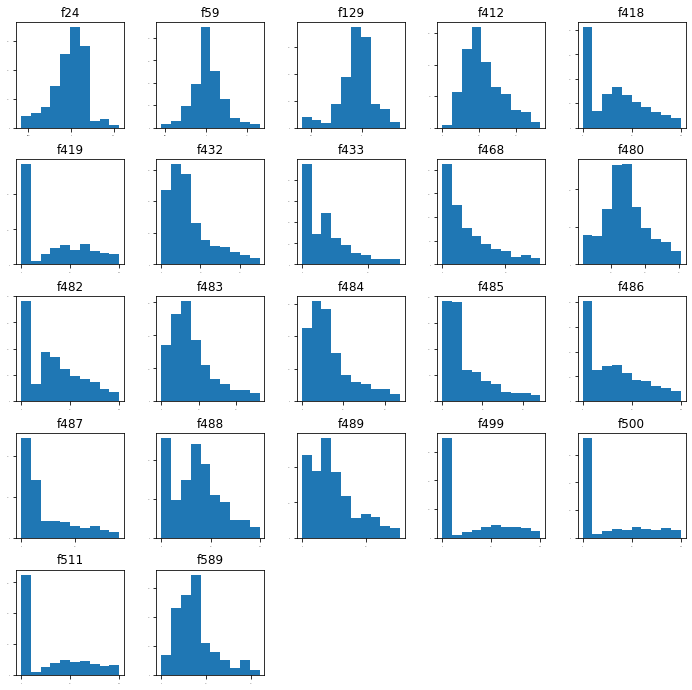

In [47]:
X_train6.hist(sharex=False, sharey=False, xlabelsize=1, ylabelsize=1,figsize=(12,12),grid=False)
plt.show()

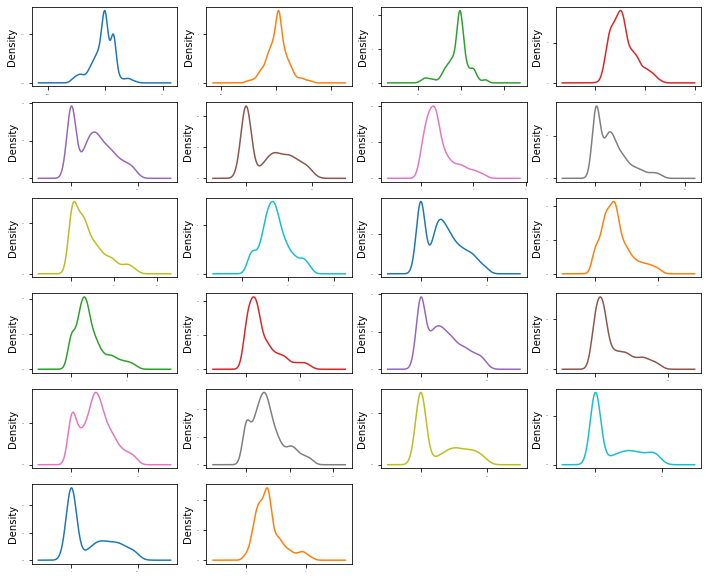

In [48]:
X_train6.plot(kind='density', subplots=True, layout=(7,4), sharex=False, legend=False,
fontsize=1, figsize=(12,12))
plt.show()

Comments on univariate analysis:

Number of features are reduced to 22 making it easier for analysis.

The histogram and density plots indicate that most of the features are skewed towards right indicating that majority of data values are low and the presence of larger values.

Also some features display two peaks(clusters).

In [49]:
# 3 B

In [50]:
# Bivariate Analysis

For any two random features

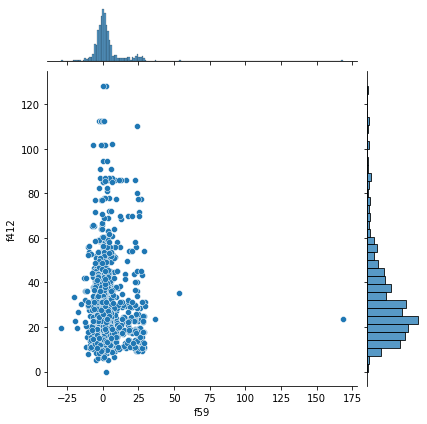

In [51]:
sns.jointplot(data=X_train, x='f59', y='f412');

For all features

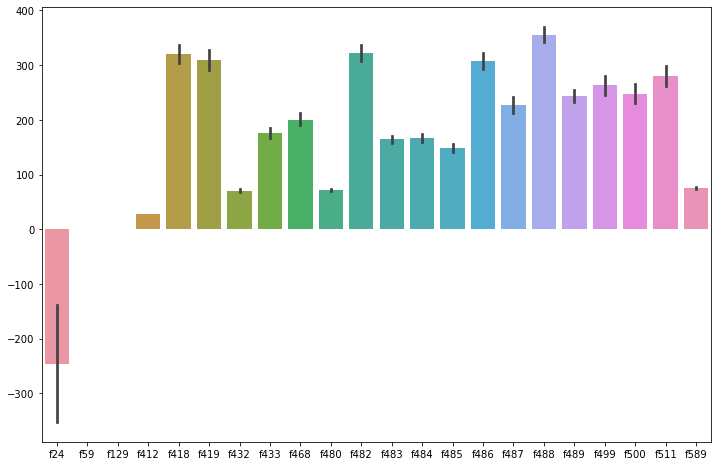

In [52]:
plt.figure(figsize=(12,8))
sns.barplot(data = X_train6);

Comments on bivariate Analysis:-

Correlation of each feature differes with the other.

Features are not strongly related.

In [53]:
# Multivariate Analysis

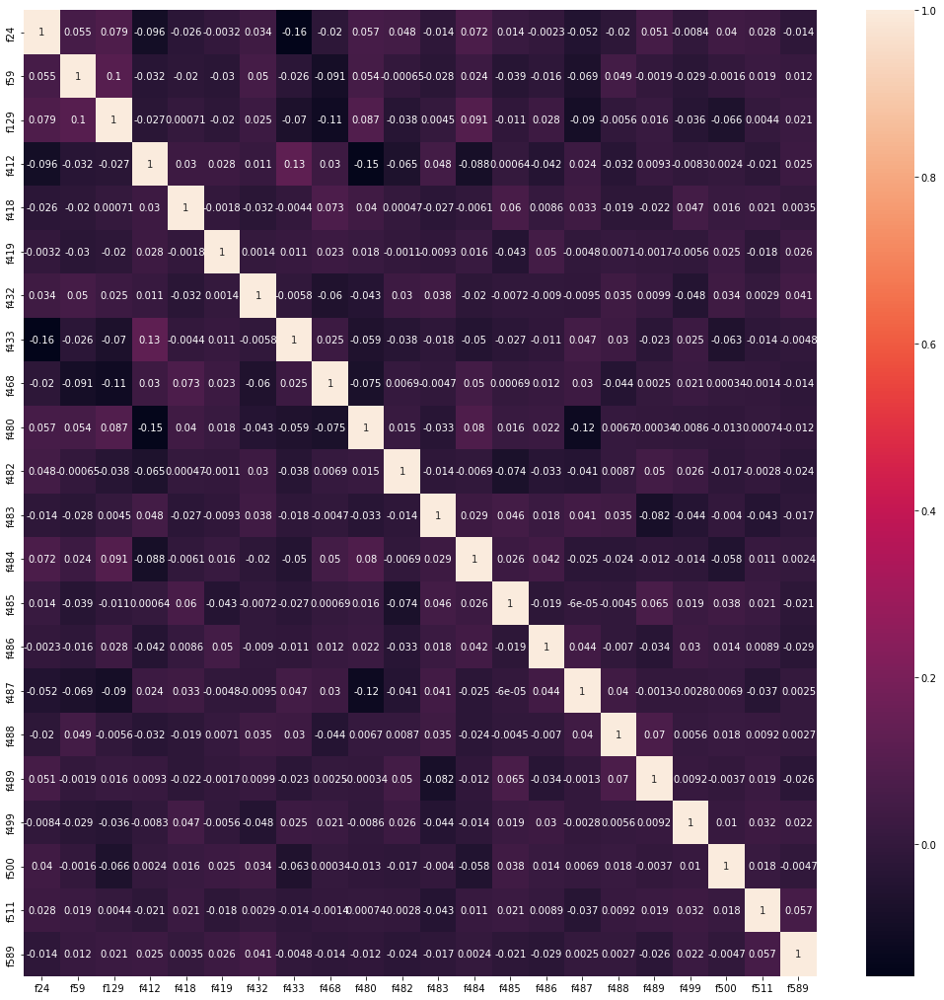

In [54]:
fig, ax = plt.subplots(figsize=(18,18))
sns.heatmap(X_train6.corr(), annot=True);

<Figure size 4000x4000 with 0 Axes>

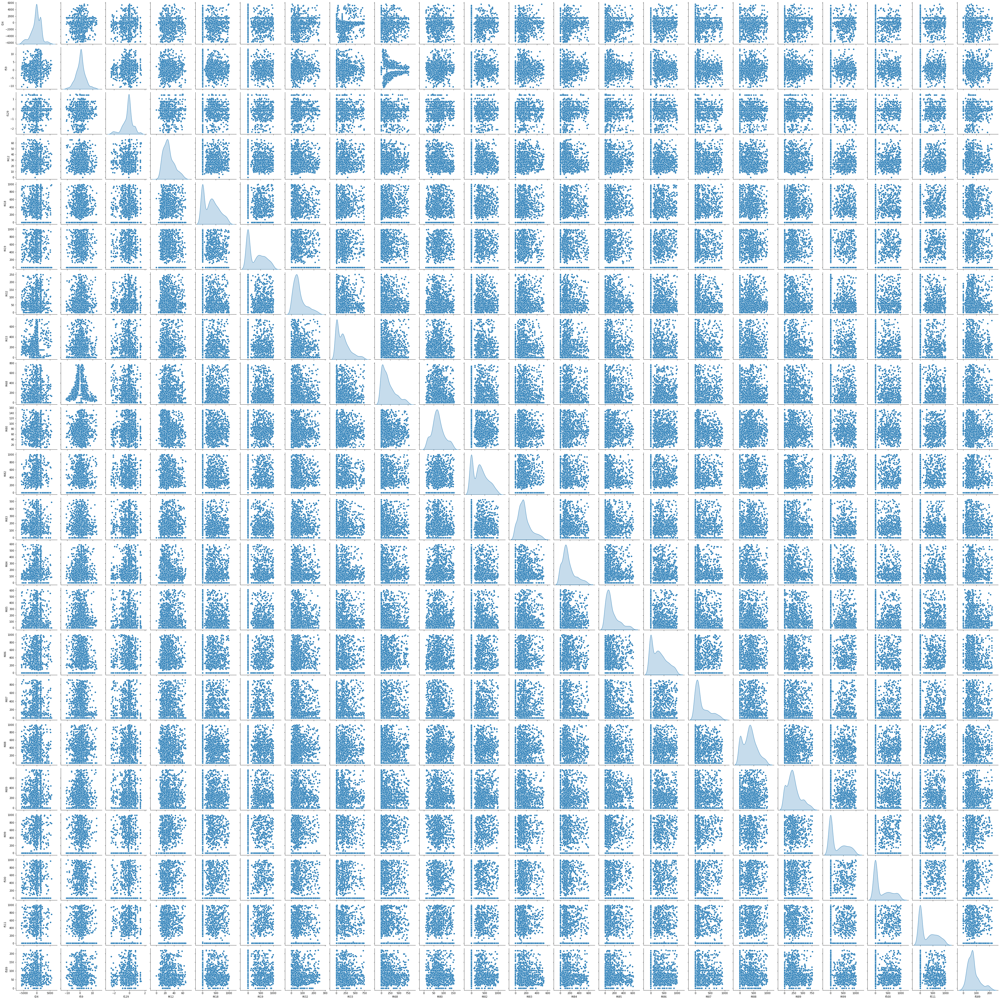

In [55]:
plt.figure(figsize=(20,20),dpi=200)
sns.pairplot(X_train6,kind='scatter',diag_kind='kde');

Comments on Multivariate analysis :-

Heatmap and Pairplot indicates that their is no strong correlation among the features.

In [56]:
# 4 A & C

Here predictors are the features and taget column is Pass/Fail

In [57]:
# 4 C (Standardization)

In [58]:
cols = X_train6.columns
sc = StandardScaler()
X_train7 = pd.DataFrame(sc.fit_transform(X_train6),columns=cols)
X_test7 = pd.DataFrame(sc.transform(X_test6),columns=cols)

In [59]:
# 4 B

In [60]:
(y_train.value_counts()/y_train.count())*100

1    93.376
0     6.624
Name: Pass/Fail, dtype: float64

-From the above it is clear that data is in imbalanced state with 93.3% pass(majority) and 6.6% fail(minority).

-To balance this we need to increase the minority class(Fail) by upsampling using SMOTE algorithm.

In [61]:
def imbalance(X,y):
    print('Original dataset shape %s' % Counter(y))
    sm = BorderlineSMOTE(sampling_strategy=1,random_state=1)
    X_res, y_res = sm.fit_resample(X, y)
    print('Resampled dataset shape %s' % Counter(y_res))
    return(X_res, y_res)

In [62]:
(X_train_final, y_train_final) = imbalance(X_train7,y_train)

Original dataset shape Counter({1: 1170, 0: 83})
Resampled dataset shape Counter({0: 1170, 1: 1170})


In [63]:
(X_test_final, y_test_final) = (X_test7, y_test)

In [64]:
# 4 C

It was done in above steps as a part of datapreparation to prevent data leak.

In [65]:
# 4 D

For original data

In [66]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,1561.0,3014.453,73.622,2743.240,2966.260,3011.490,3056.650,3356.350
1,1560.0,2495.850,80.408,2158.750,2452.248,2499.405,2538.823,2846.440
2,1553.0,2200.547,29.513,2060.660,2181.044,2201.067,2218.055,2315.267
3,1553.0,1396.377,441.692,0.000,1081.876,1285.214,1591.224,3715.042
4,1553.0,4.197,56.356,0.681,1.018,1.317,1.526,1114.537
...,...,...,...,...,...,...,...,...
586,1566.0,0.021,0.012,-0.017,0.013,0.021,0.028,0.103
587,1566.0,0.016,0.009,0.003,0.011,0.015,0.020,0.080
588,1566.0,0.005,0.003,0.001,0.003,0.005,0.006,0.029
589,1566.0,99.670,93.892,0.000,44.369,71.900,114.750,737.305


For train data

In [67]:
X_train_final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
f24,2340.0,0.013,0.867,-2.918,-0.416,9.029e-02,0.578,3.067
f59,2340.0,0.339,1.018,-3.036,-0.152,1.841e-01,0.885,3.345
f129,2340.0,0.026,0.916,-3.272,-0.373,1.219e-01,0.479,2.587
f412,2340.0,0.079,0.985,-2.236,-0.648,-5.405e-02,0.590,3.073
f418,2340.0,-0.042,0.928,-1.122,-1.122,-9.491e-02,0.591,2.371
f419,2340.0,0.022,0.961,-0.951,-0.951,-9.070e-02,0.862,2.111
f432,2340.0,-0.048,0.853,-1.269,-0.619,-2.395e-01,0.299,3.239
f433,2340.0,-0.018,0.882,-0.979,-0.779,-1.497e-01,0.408,3.147
f468,2340.0,-0.084,0.929,-1.040,-0.774,-3.886e-01,0.326,2.986
f480,2340.0,-0.041,0.993,-2.041,-0.713,-1.786e-01,0.565,2.612


In [68]:
y_train_final.describe().transpose()

count     2340
unique       2
top          0
freq      1170
Name: Pass/Fail, dtype: int64

For test data

In [69]:
X_test_final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
f24,314.0,0.068,0.891,-2.598,-0.371,0.068,0.785,2.824
f59,314.0,0.014,0.960,-3.128,-0.587,0.132,0.486,3.492
f129,314.0,-0.029,0.784,-2.842,-0.414,0.086,0.301,1.945
f412,314.0,-0.048,1.044,-1.823,-0.805,-0.267,0.567,2.997
f418,314.0,-0.014,1.026,-1.122,-1.122,-0.160,0.675,2.371
f419,314.0,-0.018,0.985,-0.951,-0.951,-0.057,0.708,2.105
f432,314.0,-0.066,0.968,-1.269,-0.767,-0.263,0.486,3.087
f433,314.0,0.035,1.027,-0.979,-0.919,-0.151,0.573,3.157
f468,314.0,-0.106,0.898,-1.040,-0.838,-0.313,0.384,2.690
f480,314.0,0.019,0.958,-1.966,-0.578,-0.015,0.463,2.439


Statistical characterstics :-

There is large variation between original, train and test data.

Mean is reduced.

Standard deviation is reduced in train and test data than original data and is near to 1.

IQR is reduced, which indicates that outliers were removed.

There is noticable reduction with regard to number of columns or features in train and test data compared to original data.

As number of columns were reduced we can say that the data is dimensionally reduced.


In [70]:
# 5 A

A function is created to build models

In [71]:
def f2_measure(y_true, y_pred):
    return fbeta_score(y_true, y_pred, beta=2)

In [72]:
def recall_minority(y_true,y_pred):
    return recall_score(y_true,y_pred,pos_label=0)

In [73]:
def default_model(X_train,y_train,X_test,y_test,model):
    model = model
    model.fit(X_train,y_train)
    print('Accuracy Score of train data = %0.3f'%model.score(X_train,y_train))
    print('Accuracy Score of test data  = %0.3f'%model.score(X_test,y_test))
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    cm = metrics.confusion_matrix(y_test,y_pred)
    print('f2-Score of train data       = %0.3f'%f2_measure(y_train,y_pred_train))
    print('f2-Score of test data        = %0.3f'%f2_measure(y_test,y_pred))
    print('\n Classification Report for Test Data \n')
    print(metrics.classification_report(y_test, y_pred))
    return({'f2-score_Test':f2_measure(y_test,y_pred)})

In [74]:
KNN_base = default_model(X_train_final,y_train_final,X_test_final,y_test_final,KNeighborsClassifier())

Accuracy Score of train data = 0.893
Accuracy Score of test data  = 0.672
f2-Score of train data       = 0.827
f2-Score of test data        = 0.718

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.12      0.62      0.20        21
           1       0.96      0.68      0.79       293

    accuracy                           0.67       314
   macro avg       0.54      0.65      0.50       314
weighted avg       0.90      0.67      0.75       314



In [75]:
# 5 B & C

Creating functions for crossvalidation and tuning to apply different models on data.

In [76]:
def cross_validation(X_train, y_train, ml_model, cv_algorithm, metric):
    
    CV = cv_algorithm
    
    results = pd.DataFrame(cross_validate(estimator=ml_model, X=X_train, y=y_train, scoring=metric, cv=CV))
    
    return({'Test Score':results['test_score'].mean(),'Standard Deviation':results['test_score'].std()})

In [77]:
def tuning(X_train, y_train, model, parameters, metric):
    
    search = RandomizedSearchCV(estimator=model,
                                param_distributions=parameters,
                                cv=StratifiedKFold(n_splits=10),
                                verbose=1,
                                n_iter=10,
                                random_state=10)
                                
    search.fit(X_train, y_train)
    print('')
    print('Best Parameters')
    print(search.best_params_)
    print('')
    return (search.best_estimator_)

In [78]:
parameters = {
    'n_neighbors': range(1, 25),
    'metric': ['canberra', 'euclidean', 'minkowski'],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}

In [79]:
model = tuning(X_train_final, y_train_final, KNeighborsClassifier(), parameters, make_scorer(f2_measure))

KNN_scores = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

KNN_f2 = cross_validation(X_train_final, y_train_final, model,StratifiedKFold(n_splits=50),make_scorer(f2_measure))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'weights': 'distance', 'n_neighbors': 7, 'metric': 'canberra', 'algorithm': 'brute'}

Accuracy Score of train data = 1.000
Accuracy Score of test data  = 0.780
f2-Score of train data       = 1.000
f2-Score of test data        = 0.826

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.16      0.52      0.24        21
           1       0.96      0.80      0.87       293

    accuracy                           0.78       314
   macro avg       0.56      0.66      0.56       314
weighted avg       0.91      0.78      0.83       314



In [80]:
model = tuning(X_train_final, y_train_final,KNeighborsClassifier(), parameters, make_scorer(recall_minority))

KNN_rscores = default_model(X_train_final,y_train_final,X_test_final,y_test_final,model)

KNN_recall = cross_validation(X_train_final,y_train_final,model,StratifiedKFold(n_splits=50),make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'weights': 'distance', 'n_neighbors': 7, 'metric': 'canberra', 'algorithm': 'brute'}

Accuracy Score of train data = 1.000
Accuracy Score of test data  = 0.780
f2-Score of train data       = 1.000
f2-Score of test data        = 0.826

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.16      0.52      0.24        21
           1       0.96      0.80      0.87       293

    accuracy                           0.78       314
   macro avg       0.56      0.66      0.56       314
weighted avg       0.91      0.78      0.83       314



In [81]:
# 5 C

Hyper-parameter tuning techniques :-

i) GridSearchCV

ii) RandomizedSearchCV


Performing individual techniques on data :-

i) GridSearch

In [82]:
gs = GridSearchCV(KNN_base, parameters, cv = 10)

In [83]:
gs = GridSearchCV(model, parameters, cv = 10)

In [84]:
gs.fit(X_train_final, y_train_final)

GridSearchCV(cv=10,
             estimator=KNeighborsClassifier(algorithm='brute',
                                            metric='canberra', n_neighbors=7,
                                            weights='distance'),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['canberra', 'euclidean', 'minkowski'],
                         'n_neighbors': range(1, 25),
                         'weights': ['uniform', 'distance']})

In [85]:
gs.best_params_

{'algorithm': 'auto',
 'metric': 'canberra',
 'n_neighbors': 1,
 'weights': 'uniform'}

In [86]:
gs.best_estimator_

KNeighborsClassifier(metric='canberra', n_neighbors=1)

ii) RandomizedSearchCV

In [87]:
randomCV = RandomizedSearchCV(estimator=model,
                                param_distributions=parameters,
                                cv=StratifiedKFold(n_splits=10),
                                verbose=1,
                                n_iter=10,
                                random_state=10)
randomCV.fit(X_train_final, y_train_final)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=KNeighborsClassifier(algorithm='brute',
                                                  metric='canberra',
                                                  n_neighbors=7,
                                                  weights='distance'),
                   param_distributions={'algorithm': ['auto', 'ball_tree',
                                                      'kd_tree', 'brute'],
                                        'metric': ['canberra', 'euclidean',
                                                   'minkowski'],
                                        'n_neighbors': range(1, 25),
                                        'weights': ['uniform', 'distance']},
                   random_state=10, verbose=1)

In [88]:
randomCV.best_params_

{'weights': 'distance',
 'n_neighbors': 7,
 'metric': 'canberra',
 'algorithm': 'brute'}

In [89]:
randomCV.best_estimator_

KNeighborsClassifier(algorithm='brute', metric='canberra', n_neighbors=7,
                     weights='distance')

In [90]:
print("Best Hyper Parameters after GridSearch tuning are :\n",gs.best_params_)
print("Best Hyper Parameters after RandomizedSearch tuning are :\n",randomCV.best_params_)

Best Hyper Parameters after GridSearch tuning are :
 {'algorithm': 'auto', 'metric': 'canberra', 'n_neighbors': 1, 'weights': 'uniform'}
Best Hyper Parameters after RandomizedSearch tuning are :
 {'weights': 'distance', 'n_neighbors': 7, 'metric': 'canberra', 'algorithm': 'brute'}


Though both hyperparameter techniques are done, Parameters obtained from RandomizedSearch are more accurate than GridSearch.

In [91]:
# 5 D

Trying Principal Component Analysis(PCA) on data obtained after feature engineering to see whether we can increase performance or not.

In [92]:
from scipy.stats import zscore
xscaled = X_train_final.apply(zscore)
xscaled.head()

,f24,f59,f129,f412,f418,f419,f432,f433,f468,f480,...,f484,f485,f486,f487,f488,f489,f499,f500,f511,f589
0,-0.046,1.039,0.144,0.071,-1.164,1.495,0.674,0.211,-0.040,0.022,...,-1.152,-1.013,-1.267,-0.540,0.333,-0.347,1.289,-0.795,1.363,-0.572
1,0.089,0.166,0.066,-0.467,0.581,-1.012,-0.581,-0.554,-0.128,0.921,...,-0.149,0.817,-1.267,-0.709,-1.162,1.780,1.676,-0.795,1.025,-0.658
2,0.074,-0.548,-1.340,-0.416,2.083,1.405,-0.825,-1.091,-1.030,0.168,...,-0.274,-0.646,0.407,0.394,0.070,-0.614,-0.840,-0.795,1.082,-0.155
3,-1.839,2.575,-0.637,-0.827,0.979,-1.012,-0.318,-0.409,-0.805,-0.967,...,0.387,0.293,0.927,-0.485,0.293,0.692,-0.840,-0.795,0.067,2.296
4,0.914,-0.848,2.017,-1.331,-0.173,-1.012,-0.474,-0.951,2.694,-1.099,...,-0.586,1.577,-1.267,-0.468,-1.200,-0.106,-0.840,-0.795,1.421,0.165


In [93]:
covMatrix = np.cov(xscaled, rowvar=False)
print(covMatrix)

[[ 1.00042753e+00  6.82489830e-02  1.16665401e-01 -9.71642222e-03
  -2.68367639e-02  6.20377016e-02  5.60450839e-02 -1.89008672e-01
   1.04579257e-02  6.56901564e-02  3.68589675e-02 -1.06134304e-01
   1.26216569e-01  6.27929022e-02 -2.63158224e-02 -6.42571307e-02
  -9.68797693e-02  1.16280373e-01 -5.89092050e-02  1.19012129e-01
   3.51982831e-02 -1.22434728e-02]
 [ 6.82489830e-02  1.00042753e+00  1.35631084e-01 -7.74621897e-02
  -7.92877081e-03  1.98040972e-02  3.80416565e-03 -4.06284537e-02
  -1.69646223e-01 -4.27113223e-02  6.06439746e-02 -7.48677484e-02
  -6.51334834e-02 -1.04735830e-01 -5.66623009e-02 -8.46636745e-02
   1.10309089e-01 -2.64242629e-02 -1.22815724e-01 -6.48976105e-02
   7.43536937e-02  1.14501872e-02]
 [ 1.16665401e-01  1.35631084e-01  1.00042753e+00 -9.43289202e-02
  -2.31674026e-02  1.80672412e-02 -2.68207457e-02 -3.82448633e-02
  -6.89711361e-02  5.90514694e-02 -3.08188017e-02 -4.00449075e-02
   1.05054254e-01 -1.45738852e-02  8.63829458e-02 -1.09177567e-01
   1.4

Applying pca on features obtained after preprocessing data:-

In [94]:
pca = PCA(n_components = 22)
pca.fit(xscaled)

PCA(n_components=22)

In [95]:
print(pca.explained_variance_)

[1.7881253  1.71667606 1.4915214  1.39940008 1.31658617 1.15940925
 1.09030992 1.0817873  1.04215108 0.96074147 0.94583976 0.90044391
 0.87622408 0.79934766 0.76686217 0.74344176 0.72502267 0.70327993
 0.65731856 0.64705809 0.62107001 0.57678911]


In [96]:
eigenvalues, eigenvectors = np.linalg.eig(covMatrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[-0.3024007  -0.13311812  0.28263024  0.10688319 -0.24053001 -0.16520307
   0.18291654 -0.22195793 -0.06887599  0.19352938 -0.22851768  0.26569678
   0.11183009 -0.28676881  0.40697023 -0.14231463 -0.27226225 -0.08661296
  -0.20448051 -0.18351985  0.15594489 -0.06772483]
 [-0.147757    0.29473821  0.04205089  0.25214542 -0.33562805  0.2749365
   0.13238958  0.07683874  0.21098746 -0.37226059 -0.21036722 -0.04335172
   0.08785013  0.32798905  0.13683383 -0.06695991  0.30271762 -0.00401646
  -0.24751299 -0.12540606 -0.15905567 -0.22937538]
 [-0.2780062   0.06881943 -0.17058289  0.25868683 -0.17226623 -0.03279291
   0.41160421 -0.0861672  -0.23271865 -0.06837802  0.3013724  -0.07748325
   0.20942173  0.12914019 -0.31279987 -0.16464045 -0.23413463 -0.26549395
   0.30127732  0.2004832   0.08763998 -0.09627795]
 [ 0.27227572 -0.20448586  0.2713352   0.21062752  0.12871976  0.0329864
   0.03741911  0.20623128 -0.20791293 -0.31194279 -0.26861824 -0.36218589
   0.17372917 -0.

In [97]:
print('Eigenvalues in descending order: \n%s' %eigenvalues)

Eigenvalues in descending order: 
[1.7881253  1.71667606 1.4915214  1.39940008 1.31658617 1.15940925
 1.09030992 1.0817873  1.04215108 0.57678911 0.96074147 0.94583976
 0.90044391 0.87622408 0.62107001 0.64705809 0.65731856 0.79934766
 0.70327993 0.76686217 0.72502267 0.74344176]


Cumulative Variance Explained [  8.12436884  15.92410718  22.70085261  29.05904373  35.04096886
  40.30875874  45.26259499  50.17770863  54.91273461  59.27787503
  63.57530936  67.66648709  71.64762175  75.27946746  78.76371497
  82.14155154  85.43570077  88.63106162  91.61759643  94.55751267
  97.37935173 100.        ]


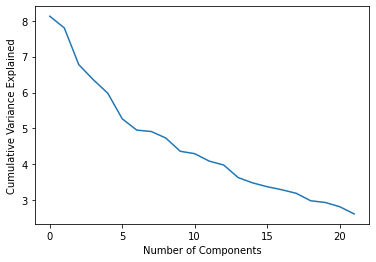

In [98]:
tot = sum(eigenvalues)
var_exp = [( i /tot ) * 100 for i in sorted(eigenvalues, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)
plt.ylabel('Cumulative Variance Explained')
plt.xlabel('Number of Components')
plt.plot(var_exp)
plt.show()

Above plot indicates a fluctuation instead of giving a sharp point(elbow) on number of components indicating that there is no particular point to extract features, given from the data.

In [99]:
def pca_fn(X_train_final, variance = 0.95, n_comp = None):
   
    from sklearn.decomposition import PCA
    print('Total columns in Input Dataframe : {}'.format(X_train_final.shape[1]))
    X_train_final = X_train_final.select_dtypes(['int','float'])
    print('Columns in Input Dataframe that are considered for PCA : {}'.format(X_train_final.shape[1]))
    if isinstance(n_comp, int):
        pca = PCA(n_comp)
    else:
        pca = PCA(variance)
    
    pca.fit(X_train_final)
    
    n_comp = pca.n_components_
    print('Input Dataframe with {} columns has been reduced to {} principal components!'.format(X_train_final.shape[1],n_comp))
    print('Explained Variation with {} principal components: {}'.format(n_comp,sum(pca.explained_variance_ratio_)))
    
    pca_X_train_final = pd.DataFrame(data = pca.transform(X_train_final), columns = ['pca_col_'+str(x+1) for x in range(n_comp)], index = X_train_final.index)
    return [pca_X_train_final,pca]

In [100]:
pca_fn = pca_fn(X_train_final, variance = 0.95)

Total columns in Input Dataframe : 22
Columns in Input Dataframe that are considered for PCA : 22
Input Dataframe with 22 columns has been reduced to 21 principal components!
Explained Variation with 21 principal components: 0.9738834162463899


By doing PCA, we can only reduce one feature to get 97% variance which does not have much role in increasing the performance of a model. Hence we continue with the features obtained from the preprocessed data(Data cleaning, outliers treatment, Important feature extraction) for tuning and performing various algorithms on different models.

In [101]:
# 5 E

Classification report of base model

In [102]:
KNN_base = default_model(X_train_final,y_train_final,X_test_final,y_test_final,KNeighborsClassifier())

Accuracy Score of train data = 0.893
Accuracy Score of test data  = 0.672
f2-Score of train data       = 0.827
f2-Score of test data        = 0.718

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.12      0.62      0.20        21
           1       0.96      0.68      0.79       293

    accuracy                           0.67       314
   macro avg       0.54      0.65      0.50       314
weighted avg       0.90      0.67      0.75       314



Classification report after tuning parameters (From randomizedsearch)

In [103]:
KNN_scores = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

Accuracy Score of train data = 1.000
Accuracy Score of test data  = 0.780
f2-Score of train data       = 1.000
f2-Score of test data        = 0.826

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.16      0.52      0.24        21
           1       0.96      0.80      0.87       293

    accuracy                           0.78       314
   macro avg       0.56      0.66      0.56       314
weighted avg       0.91      0.78      0.83       314



-Precision is good on both base and tuned model with above 90%.

-Accuracy Score of test data has increased from 67% to 78% after tuning.

-f2-Score of test data has increased from 71.8% to 82.6%.

-The base KNN model gives a recall score of 62% for majority class.

-Recall and f1-score show marked increase from base model to tuned model.

In [104]:
# 5 F

In [105]:
# SVM

In [106]:
parameters = {
    'C': [0.1,1,10,100],
    'kernel': ['linear','rbf'],
    'gamma':[0.001,0.01,0.1,1]
}

model = tuning(X_train_final, y_train_final,SVC(random_state=10), parameters, make_scorer(recall_minority))

SVM_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

SVM = cross_validation(X_train_final, y_train_final, model, StratifiedKFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'kernel': 'rbf', 'gamma': 0.1, 'C': 10}

Accuracy Score of train data = 1.000
Accuracy Score of test data  = 0.927
f2-Score of train data       = 1.000
f2-Score of test data        = 0.980

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        21
           1       0.93      0.99      0.96       293

    accuracy                           0.93       314
   macro avg       0.47      0.50      0.48       314
weighted avg       0.87      0.93      0.90       314



In [107]:
# Guassian Naive Byes

In [108]:
parameters = {
    'var_smoothing':np.logspace(0,-9,num=100)
}

model = tuning(X_train_final, y_train_final, GaussianNB(), parameters, make_scorer(recall_minority))

GNB_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

GNB = cross_validation(X_train_final, y_train_final, model, StratifiedKFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'var_smoothing': 0.0533669923120631}

Accuracy Score of train data = 0.751
Accuracy Score of test data  = 0.599
f2-Score of train data       = 0.701
f2-Score of test data        = 0.659

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.07      0.38      0.11        21
           1       0.93      0.61      0.74       293

    accuracy                           0.60       314
   macro avg       0.50      0.50      0.43       314
weighted avg       0.87      0.60      0.70       314



In [109]:
# Logistic Regression

In [110]:
parameters = {
    'penalty': ['l1','l2','elasticnet','none'],
    'C': np.logspace(-4,4,20),
    'solver': ['lbfgs','newton-cg','sag','saga'],
    'max_iter':[100,1000,2500,5000,10000]
}

model = tuning(X_train_final, y_train_final,
               LogisticRegression(random_state=10), parameters,make_scorer(recall_minority))

LR_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

LR = cross_validation(X_train_final, y_train_final, model, StratifiedKFold(n_splits=10),make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'solver': 'newton-cg', 'penalty': 'none', 'max_iter': 1000, 'C': 78.47599703514607}

Accuracy Score of train data = 0.752
Accuracy Score of test data  = 0.710
f2-Score of train data       = 0.731
f2-Score of test data        = 0.765

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.10      0.43      0.17        21
           1       0.95      0.73      0.82       293

    accuracy                           0.71       314
   macro avg       0.52      0.58      0.49       314
weighted avg       0.89      0.71      0.78       314



In [111]:
# Decision Tree Classifier

In [112]:
parameters = {
    'criterion':['gini','entropy'],
    'max_depth': range(1, 25),
    'min_samples_leaf':[5,10,20,50,100]
}

model = tuning(X_train_final, y_train_final,
               DecisionTreeClassifier(random_state=10), parameters, make_scorer(recall_minority))

DT_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

DT = cross_validation(X_train_final, y_train_final, model, StratifiedKFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'min_samples_leaf': 5, 'max_depth': 8, 'criterion': 'gini'}

Accuracy Score of train data = 0.928
Accuracy Score of test data  = 0.796
f2-Score of train data       = 0.909
f2-Score of test data        = 0.853

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.11      0.29      0.16        21
           1       0.94      0.83      0.88       293

    accuracy                           0.80       314
   macro avg       0.53      0.56      0.52       314
weighted avg       0.89      0.80      0.84       314



In [113]:
# XGBoost

In [114]:
parameters = {
    'n_estimators':[10,50,100,150,200,300,500],
    'max_depth': range(1,25),
    'learning_rate': [0.01,0.1,0.2],
    'colsample_bytree':[0.1,0.2,0.3],
    'subsample':[0.2,0.4,0.6,0.8,1],
    'gamma':[5,10,15]
}

model = tuning(X_train_final, y_train_final,XGBClassifier(random_state=10), parameters, make_scorer(recall_minority))

XGB_score = default_model(X_train_final,y_train_final,X_test_final,y_test_final,model)

XGB = cross_validation(X_train_final,y_train_final,model,StratifiedKFold(n_splits=10),make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'subsample': 0.6, 'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.2, 'gamma': 5, 'colsample_bytree': 0.2}

Accuracy Score of train data = 0.980
Accuracy Score of test data  = 0.847
f2-Score of train data       = 0.983
f2-Score of test data        = 0.903

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.11      0.19      0.14        21
           1       0.94      0.89      0.92       293

    accuracy                           0.85       314
   macro avg       0.53      0.54      0.53       314
weighted avg       0.88      0.85      0.86       314



In [115]:
# AdaBoost

In [116]:
parameters = {
    'n_estimators': [10, 50, 100, 150, 200],
    'learning_rate':[0.001,0.01,0.1,0.2,0.5]
}

model = tuning(X_train_final, y_train_final,
               AdaBoostClassifier(random_state=10), parameters, make_scorer(recall_minority))

AdaBoost_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

AdaBoost = cross_validation(X_train_final, y_train_final, model, KFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'n_estimators': 100, 'learning_rate': 0.5}

Accuracy Score of train data = 0.922
Accuracy Score of test data  = 0.787
f2-Score of train data       = 0.905
f2-Score of test data        = 0.844

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.10      0.29      0.15        21
           1       0.94      0.82      0.88       293

    accuracy                           0.79       314
   macro avg       0.52      0.55      0.51       314
weighted avg       0.89      0.79      0.83       314



In [117]:
# Bagging Classifier

In [118]:
parameters = {
    'n_estimators': [10, 50, 100],
    'max_samples':[0.05,0.1,0.2,0.5]
}

model = tuning(X_train_final, y_train_final,
               BaggingClassifier(random_state=10), parameters, make_scorer(recall_minority))

Bagging_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

Bagging = cross_validation(X_train_final, y_train_final, model, KFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'n_estimators': 100, 'max_samples': 0.5}

Accuracy Score of train data = 0.989
Accuracy Score of test data  = 0.857
f2-Score of train data       = 0.991
f2-Score of test data        = 0.918

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.04      0.05      0.04        21
           1       0.93      0.91      0.92       293

    accuracy                           0.86       314
   macro avg       0.48      0.48      0.48       314
weighted avg       0.87      0.86      0.86       314



In [119]:
# Random Forest Classifier

In [120]:
parameters = {
    'criterion':['gini','entropy'],
    'n_estimators': [10, 50, 100, 150, 200],
    'max_depth': range(1, 25),
    'min_samples_split':[5,10],
    'min_samples_leaf':[5,10]
}

model = tuning(X_train_final, y_train_final, RandomForestClassifier(random_state=10), parameters, make_scorer(recall_minority))

RF_score = default_model(X_train_final, y_train_final, X_test_final, y_test_final, model)

RF = cross_validation(X_train_final, y_train_final, model, StratifiedKFold(n_splits=10), make_scorer(recall_minority))

Fitting 10 folds for each of 10 candidates, totalling 100 fits

Best Parameters
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_depth': 21, 'criterion': 'gini'}

Accuracy Score of train data = 0.971
Accuracy Score of test data  = 0.873
f2-Score of train data       = 0.976
f2-Score of test data        = 0.927

 Classification Report for Test Data 

              precision    recall  f1-score   support

           0       0.12      0.14      0.13        21
           1       0.94      0.92      0.93       293

    accuracy                           0.87       314
   macro avg       0.53      0.53      0.53       314
weighted avg       0.88      0.87      0.88       314



In [121]:
# 6 A

Train accuracy

In [122]:
models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("XGB", XGBClassifier(verbosity=0)))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=55,shuffle=True)
    cv_results = cross_val_score(model, X_train_final, y_train_final, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f%% (%f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

LR: 74.230769% (2.873435%)
KNN: 82.435897% (1.787224%)
GNB: 73.974359% (1.962558%)
SVM: 75.598291% (2.637483%)
DT: 90.726496% (1.378826%)
RF: 96.239316% (1.414782%)
AB: 87.863248% (1.903509%)
XGB: 97.094017% (1.205704%)


Test accuracy

In [123]:
models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("XGB", XGBClassifier(verbosity=0)))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=55,shuffle=True)
    cv_results = cross_val_score(model, X_test_final, y_test_final, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f%% (%f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

LR: 93.306452% (0.999154%)
KNN: 93.316532% (0.901697%)
GNB: 91.068548% (2.417758%)
SVM: 93.316532% (0.901697%)
DT: 88.205645% (3.782593%)
RF: 93.316532% (0.901697%)
AB: 92.358871% (2.112996%)
XGB: 92.681452% (1.989849%)


In [124]:
summary_CV = pd.DataFrame(
    [LR, RF, KNN_recall, XGB, AdaBoost, Bagging, DT, SVM, GNB],
    index=[
        'Logistic Regression', 'Random Forest', 'KNN', 'XGBoost', 'AdaBoost',
        'Bagging Classifier', 'Decision Tree', 'SVM', 'Gaussian Naive Bayes'
    ])
print('\nSummary of Cross Validation Results on Training Data')
display(summary_CV.sort_values(by='Test Score', ascending=False))


Summary of Cross Validation Results on Training Data


,Test Score,Standard Deviation
SVM,0.991,0.027
KNN,0.990,0.038
XGBoost,0.950,0.145
Random Forest,0.925,0.121
Decision Tree,0.919,0.090
Gaussian Naive Bayes,0.806,0.101
Logistic Regression,0.775,0.078
Bagging Classifier,0.771,0.226
AdaBoost,0.705,0.277


In [125]:
# 6 B

SVM and KNN are final best trained models, among these SVM is considered as best model as it has 99.1 test score with a standard deviation of 0.027 followed by KNN with 99.0 test score with a standard deviation of 0.038.

In [126]:
# 6 C

In [127]:
import pickle

In [128]:
pickle.dump(SVM, open('model.pkl','wb'))

In [129]:
# Loading model to compare the results

In [130]:
model1 = pickle.load(open('model.pkl','rb'))

In [131]:
model1

{'Test Score': 0.9914529914529915, 'Standard Deviation': 0.02702801418947334}

In [132]:
# From the below step, one can see a file with the name model_pkl in the directory for future use

In [133]:
with open('model_pkl', 'wb') as files:
    pickle.dump(SVM, files)

In [134]:
# 6 D

-After reducing number of features or variables and fine tuning parameters on different models SVM is considered as the 

best model.

-KNN can also be considered as best model based on precision as it shows same precision of 96% before and after tuning 

parameters. Hence, we can also use KNN base model sometimes.